<a href="https://colab.research.google.com/github/sugiyama404/acrobot/blob/main/Acrobot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%tensorflow_version 1.x
!apt install swig cmake libopenmpi-dev zlib1g-dev pyvirtualdisplay pyopengl pyglet box2d box2d-kengz
!apt-get install -y xvfb python-opengl ffmpeg

!pip install stable-baselines[mpi]==2.8.0 piglet pyvirtualdisplay icecream

TensorFlow 1.x selected.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package pyvirtualdisplay
E: Unable to locate package pyopengl
E: Unable to locate package pyglet
E: Unable to locate package box2d
E: Unable to locate package box2d-kengz
Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:3.4.8-0ubuntu0.2).
Suggested packages:
  libgle3
The following NEW packages will be installed:
  python-opengl xvfb
0 upgraded, 2 newly installed, 0 to remove and 39 not upgraded.
Need to get 1,281 kB of archives.
After this operation, 7,686 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 python-opengl all 3.1.0+dfsg-1 [496 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 xvfb amd64 2:1.19.6-1ubuntu4.9 [784 kB]
Fetched 1,281 kB in 0s (9,286 kB/s)
Selecting previously u

In [2]:
import os

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)
import tensorflow as tf
tf.get_logger().setLevel('INFO')
tf.autograph.set_verbosity(0)
import logging
tf.get_logger().setLevel(logging.ERROR)

In [3]:
import time
import numpy as np
import matplotlib.pyplot as plt

import gym
from gym.wrappers import Monitor

from stable_baselines.deepq.policies import MlpPolicy,LnMlpPolicy, CnnPolicy, LnCnnPolicy
from stable_baselines.common.vec_env import DummyVecEnv, SubprocVecEnv
from stable_baselines.common import set_global_seeds
from stable_baselines import DQN

from stable_baselines.common.vec_env import VecVideoRecorder


from IPython import display as ipythondisplay
from IPython.display import HTML

from pyvirtualdisplay import Display
Display().start()

import warnings
warnings.filterwarnings("ignore")

import io
import glob
import base64

import re
from icecream import ic

In [4]:
env_id='Acrobot-v1'
cell=['MlpPolicy','LnMlpPolicy', 'CnnPolicy', 'LnCnnPolicy']
policies=cell[0]
ave_csv = policies + '_average.csv'
win_csv = policies + '_win.csv'
csv_files = [ave_csv,win_csv]
env_vec = DummyVecEnv([lambda: gym.make(env_id)])

In [5]:
def evaluate(env, model, n_step=10000, n_ave=100):

    states = env.reset()
    true_num = 0
    ave_num = 0

    for i in range(n_step):
        action, _h = model.predict(states)
        states, rewards, dones, info = env.step(action)

        if dones[0]:
            states = env.reset()
            true_num += 1
            ave_num += 1

        if re.match('^[0-9]000+$', str(i)):
            print('ave_num = ' + str(ave_num))
            with open(ave_csv, 'a') as f:
                print(str(ave_num), file=f)
            ave_num = 0
    
    print('取得報酬 =' + str(true_num))
    with open(win_csv, 'a') as f:
        print(str(true_num), file=f)

In [6]:
import imageio
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

def video_anime(video_dir):
    video_list = glob.glob(video_dir+"/*.mp4")
    if len(video_list) > 0:
        mp4 = video_list[0]
        video = imageio.mimread(mp4,memtest=False)
        fig = plt.figure(figsize=(5,5))

        mov = []
        for i in range(len(video)):
            img = plt.imshow(video[i], animated=True)
            plt.axis('off')
            mov.append([img])
     
        anime = animation.ArtistAnimation(fig, mov, interval=50, repeat_delay=1000)
        plt.close()
        return anime

In [7]:
import shutil

train_cnt = [0,25000,50000,75000,100000,125000,150000]
dir_f = ['negative_control/','traning_25000/','traning_50000/','traning_75000/','traning_100000/','traning_125000/','traning_150000/']

for item in dir_f:
    file_exit=os.path.exists(item)
    if file_exit:
        shutil.rmtree(item)
        print(item + " ディレクトリーの削除に成功しました。")

for item in csv_files:
    csv_exit=os.path.isfile(item)
    if csv_exit:
        os.remove(item)
        print(item + " ファイルの削除に成功しました。")

for index, item in enumerate(train_cnt):
    
    model = DQN(policies, env_vec, verbose=0)
    folder_name = dir_f[index]

    if item != 0:
        model.learn(total_timesteps=item)
        model.save(policies + "-Acrobot" + str(item))


    env = VecVideoRecorder(env_vec, video_folder=folder_name,
                                record_video_trigger=lambda step: step == 0, video_length=1000,
                                name_prefix="tran")

    evaluate(env, model, n_step=10000, n_ave=100)

ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
取得報酬 =20
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
ave_num = 2
取得報酬 =20
ave_num = 10
ave_num = 10
ave_num = 9
ave_num = 11
ave_num = 11
ave_num = 10
ave_num = 11
ave_num = 10
ave_num = 10
取得報酬 =103
ave_num = 2
ave_num = 3
ave_num = 3
ave_num = 2
ave_num = 3
ave_num = 2
ave_num = 2
ave_num = 4
ave_num = 5
取得報酬 =30
ave_num = 12
ave_num = 11
ave_num = 11
ave_num = 11
ave_num = 11
ave_num = 11
ave_num = 11
ave_num = 12
ave_num = 12
取得報酬 =113
ave_num = 11
ave_num = 12
ave_num = 11
ave_num = 12
ave_num = 9
ave_num = 12
ave_num = 13
ave_num = 11
ave_num = 12
取得報酬 =114
ave_num = 10
ave_num = 14
ave_num = 10
ave_num = 11
ave_num = 13
ave_num = 11
ave_num = 13
ave_num = 11
ave_num = 12
取得報酬 =116


In [8]:
# HTML(video_anime('negative_control_videos').to_html5_video()) 

In [9]:
# HTML(video_anime('traning_videos').to_html5_video()) 

In [10]:
dir_f = ['negative_control/','traning_25000/','traning_50000/','traning_75000/','traning_100000/','traning_125000/','traning_150000/']
new_name = ['negative_control.mp4','traning_25000.mp4','traning_50000.mp4','traning_75000.mp4','traning_100000.mp4','traning_125000.mp4','traning_150000.mp4']

folder_exit=os.path.exists('tmp/')
if folder_exit:
    shutil.rmtree('tmp/')
    print('tmp/ディレクトリーの削除に成功しました。')

os.mkdir('tmp')

for index, item in enumerate(dir_f):
    video_list = glob.glob(item+"/*.mp4")
    if len(video_list) > 0:
        mp4 = video_list[0]
        shutil.move(mp4, 'tmp/' + new_name[index])



In [11]:
import cv2
from google.colab.patches import cv2_imshow

from PIL import Image
import glob


new_name = ['negative_control','traning_25000','traning_50000','traning_75000','traning_100000','traning_125000','traning_150000']

folder_exit=os.path.exists('dist/')
if folder_exit:
    shutil.rmtree('dist/')
    print('dist/ディレクトリーの削除に成功しました。')

os.mkdir('dist')

i = 0

for item in new_name:

    cap = cv2.VideoCapture('tmp/' + item + '.mp4')

    while(True):
        i +=1

        ret, frame = cap.read()
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(frame, item , (20, 50), font, 1,
                    (255, 0, 0), 1, cv2.LINE_4)
    
        if frame is None:
            break
        
        dst_file = "dist/{index:04d}.jpg".format(index=i)
        cv2.imwrite(dst_file, frame)
        #cv2_imshow(frame)
    
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    
    cap.release()
    cv2.destroyAllWindows()

files = sorted(glob.glob('dist/*.jpg'))  
images = list(map(lambda file : Image.open(file) , files))
images[0].save(policies + '_image.gif' , save_all = True , append_images = images[1:] , duration = 60 , loop = 0)

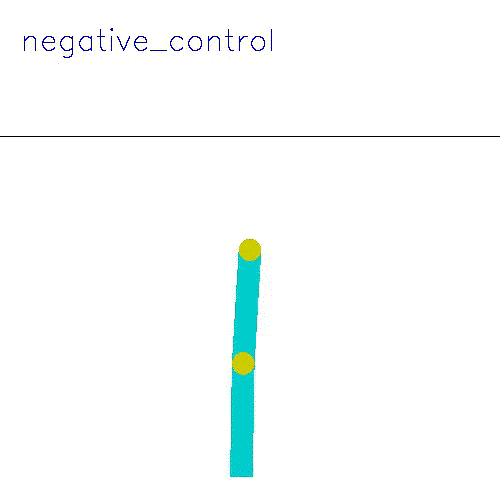

In [12]:
from IPython.display import Image as getImage

getImage(policies + '_image.gif', format='jpg')